## Install all the needed libraries

In [ ]:
!pip install requirements.txt

In [1]:
import numpy as np
import pandas as pd
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import os 
import random
import cv2 as cv
import kaggle

## Download the data set from Kaggle

In [2]:
!mkdir ~/.kaggle

mkdir: Не вдалося створити каталог «/home/user/.kaggle»: Файл вже існує


*Into the created directory insert file kaggle.json. You can find it in your account settings on Kaggle, "**create new token**"*

In [3]:
!mkdir data

mkdir: Не вдалося створити каталог «data»: Файл вже існує


In [4]:
!mkdir data/data_core

In [5]:
!ls

 data
 data_analysis.ipynb
 data_preporation.ipynb
 README.md
'Trainee ML Engineer Vacancy - Object Recognition and Classification Task.pdf'


In [15]:
dataset_name = 'khlaifiabilel/military-aircraft-recognition-dataset'

download_dir = 'data/data_core'

# Download the dataset
kaggle.api.dataset_download_files(dataset_name, path=download_dir, unzip=True)

## Structure of data set

In [2]:
!ls data/data_core

Annotations  ImageSets	JPEGImages


In [3]:
!ls data/data_core/Annotations

'Horizontal Bounding Boxes'  'Oriented Bounding Boxes'


In [4]:
!ls data/data_core/ImageSets/Main

test.txt  train.txt


## Analysis

In [5]:
labels_path = "data/data_core/Annotations/Horizontal Bounding Boxes/"
images_path = "data/data_core/JPEGImages/"

test_dist_file = "data/data_core/ImageSets/Main/test.txt"
train_dist_file = "data/data_core/ImageSets/Main/train.txt"

In [6]:
file_tmp = open(test_dist_file, "r")
test_files = list(map(int, file_tmp.readlines()))
file_tmp.close()

In [7]:
file_tmp = open(train_dist_file, "r")
train_files = list(map(int, file_tmp.readlines()))
file_tmp.close()

In [8]:
labels_dir = np.array(os.listdir(labels_path))

In [9]:
len(labels_dir)

3842

### Showed some examples of the data

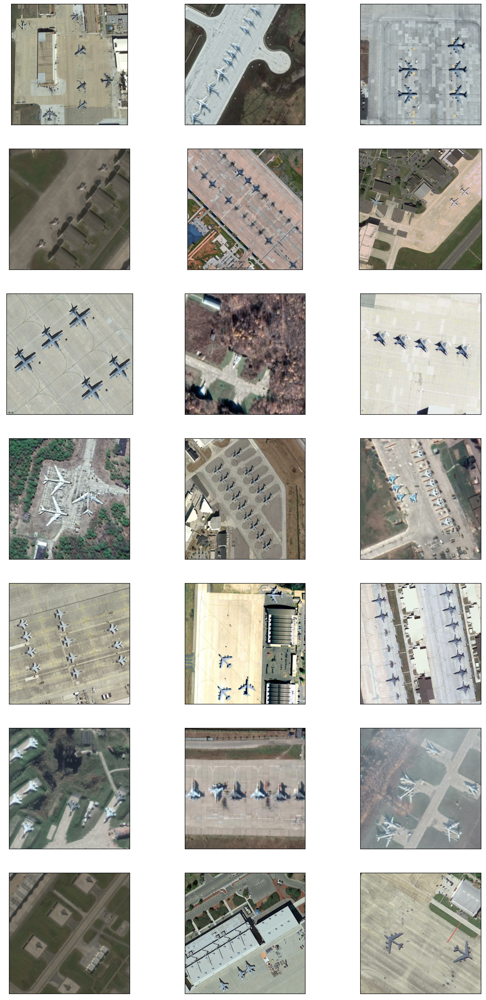

In [10]:
fig, axis = plt.subplots(nrows=7, ncols=3, figsize=(15, 30))

for i in range(7):
    for j in range(3):
        image = cv.cvtColor(cv.imread(os.path.join(images_path, f"{random.choice(labels_dir)[:-3]}jpg")), cv.COLOR_BGR2RGB)
        
        axis[i, j].set_xticks([])
        axis[i, j].set_yticks([])
        axis[i, j].imshow(image)

### Create arrays with information about images (image_info) and with labels

In [11]:
image_info = []
labels = []

for xml_path in labels_dir:

    tree = ET.parse(os.path.join(labels_path, xml_path))
    
    root = tree.getroot()
        
    size = root.find("size")
    
    width = int(size.find("width").text)
    height = int(size.find("height").text)
    number_of_obj = len(root.findall('object'))
    
    image_info.append([width, height, number_of_obj])
    
    image = cv.cvtColor(cv.imread(os.path.join(images_path, xml_path[:-3] + "jpg")), cv.COLOR_BGR2RGB)
    height, width, _ = image.shape
    
    label = []
    for obj in root.findall("object"):
        name = int(obj.find("name").text[1:])
        
        bb = obj.find("bndbox")
        
        xmin, ymin, xmax, ymax = (int(bb.find("xmin").text) / width,
                                  int(bb.find("ymin").text) / height,
                                  int(bb.find("xmax").text) / width,
                                  int(bb.find("ymax").text) / height)
        label.append([xmin, ymin, xmax, ymax, name])
        
    labels.append(np.array(label))

In [12]:
image_info = np.array(image_info)
labels = np.array(labels, dtype=np.object_)

### Analys of size of the image and number of objects on the image

In [13]:
image_info.max(axis=0), image_info.mean(axis=0), image_info.min(axis=0)

(array([1389,  989,   50]),
 array([800.6033316 , 790.82118688,   5.81494014]),
 array([0, 0, 1]))

In [14]:
image_info[(image_info[:, :2] == 0).any(axis=1)]

array([[ 0,  0,  3],
       [ 0,  0, 21],
       [ 0,  0, 17],
       [ 0,  0,  3],
       [ 0,  0,  2],
       [ 0,  0,  3],
       [ 0,  0,  6],
       [ 0,  0,  9],
       [ 0,  0,  2],
       [ 0,  0,  6],
       [ 0,  0,  4],
       [ 0,  0,  3],
       [ 0,  0,  4],
       [ 0,  0,  4],
       [ 0,  0,  3],
       [ 0,  0,  2],
       [ 0,  0,  3],
       [ 0,  0,  4],
       [ 0,  0,  2],
       [ 0,  0, 17],
       [ 0,  0,  5]])

### Check images without labeled size

In [15]:
sus_images = labels_dir[(image_info[:, :2] == 0).any(axis=1)]
sus_images

array(['334.xml', '429.xml', '430.xml', '338.xml', '426.xml', '349.xml',
       '443.xml', '452.xml', '409.xml', '442.xml', '476.xml', '420.xml',
       '482.xml', '335.xml', '348.xml', '340.xml', '326.xml', '405.xml',
       '421.xml', '431.xml', '480.xml'], dtype='<U8')

### Show suspicious images

(722, 736, 3)
(728, 1036, 3)
(623, 726, 3)
(744, 764, 3)
(716, 793, 3)
(708, 743, 3)
(736, 957, 3)
(839, 863, 3)
(676, 808, 3)
(768, 781, 3)
(722, 840, 3)
(762, 809, 3)
(781, 736, 3)
(794, 745, 3)
(735, 856, 3)
(727, 791, 3)
(706, 841, 3)
(643, 696, 3)
(725, 805, 3)
(708, 738, 3)
(656, 839, 3)


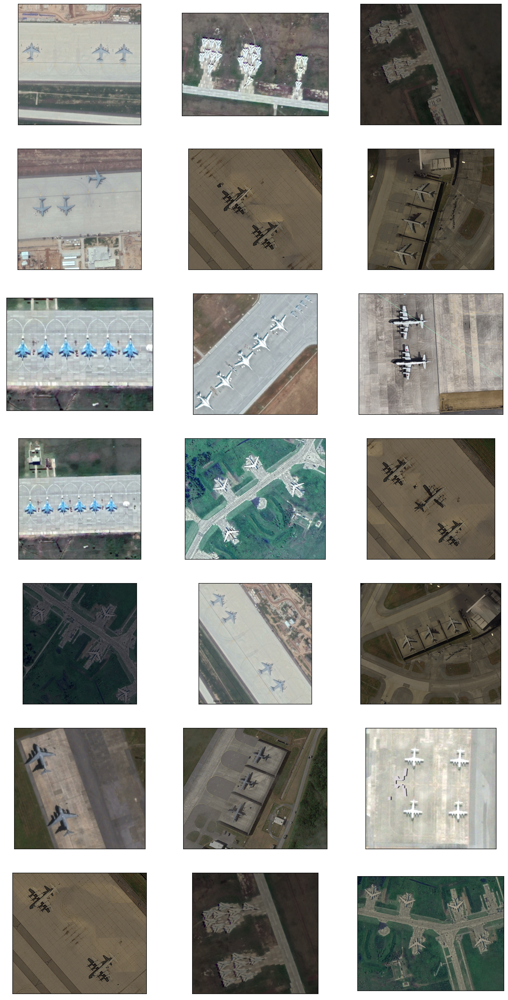

In [16]:
fig, axis = plt.subplots(nrows=7, ncols=3, figsize=(15, 30))

for i in range(7):
    for j in range(3):
        image = cv.cvtColor(cv.imread(os.path.join(images_path, f"{sus_images[i*3+j][:-3]}jpg")), cv.COLOR_BGR2RGB)
        print(image.shape)
        axis[i, j].set_xticks([])
        axis[i, j].set_yticks([])
        axis[i, j].imshow(image)

In [17]:
image_info[(image_info[:, :2] != 0).any(axis=1)].min(axis=0)

array([590, 549,   1])

*As we can see, they are just mislabeled but images are ok*

### Analys of class distribution

In [18]:
classes = np.array([rect[-1] for label in labels for rect in label])

In [19]:
len(classes)

22341

In [20]:
classes

array([16., 16., 16., ..., 14., 14., 14.])

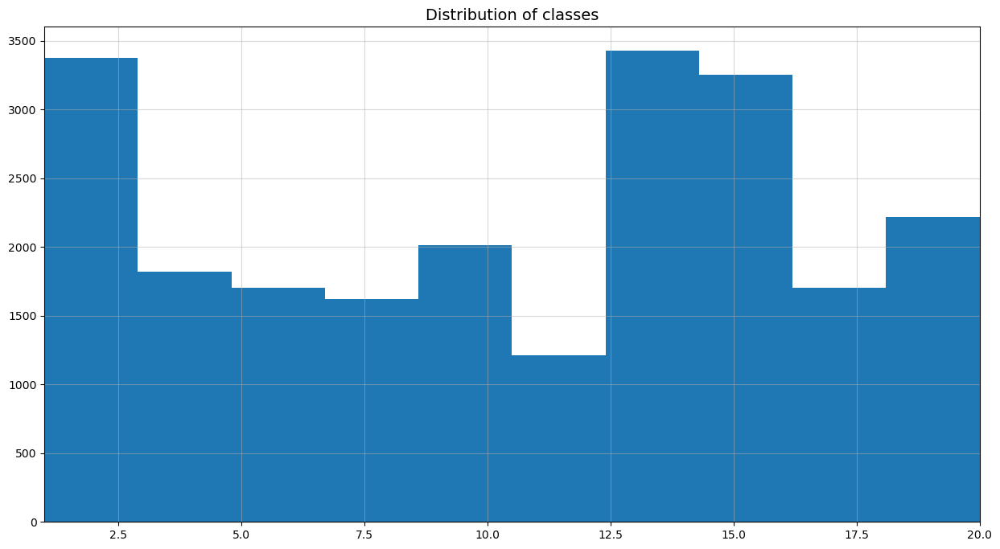

In [21]:
plt.figure(figsize=(15, 8))

plt.hist(classes)
plt.title("Distribution of classes", fontsize=14)
plt.grid(alpha=0.5)
plt.xlim(1, 20)
plt.show()

*The distribution of classes is pretty decent but we also have to check it on test and train data*

### Check test images

In [22]:
labels_test_dir = labels_dir[np.array(list(map(lambda text: int(text[:-4]) in test_files, labels_dir)))]

In [23]:
len(labels_test_dir)

2511

In [24]:
labels_test = labels[np.array(list(map(lambda text: int(text[:-4]) in test_files, labels_dir)))]

In [25]:
len(labels_test)

2511

### Show images

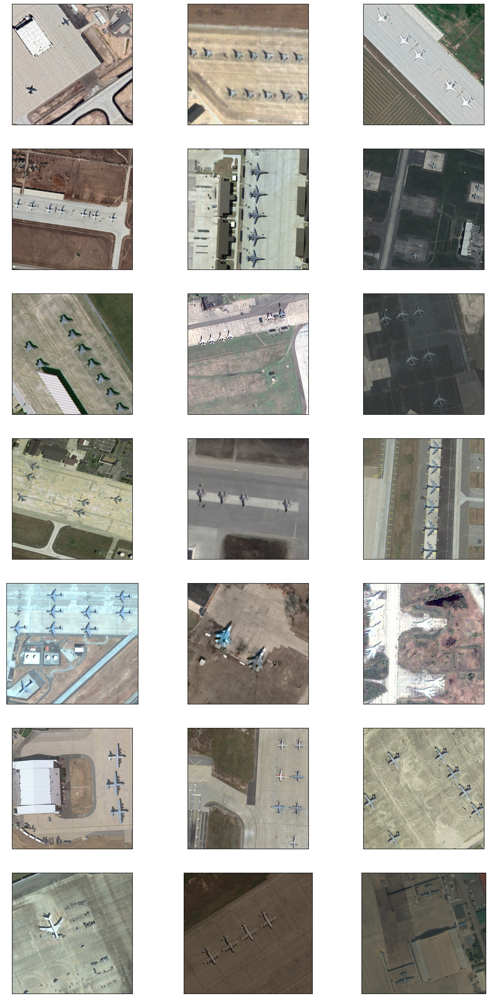

In [26]:
fig, axis = plt.subplots(nrows=7, ncols=3, figsize=(15, 30))

for i in range(7):
    for j in range(3):
        image = cv.cvtColor(cv.imread(os.path.join(images_path, f"{random.choice(labels_test_dir)[:-3]}jpg")), cv.COLOR_BGR2RGB)
        
        axis[i, j].set_xticks([])
        axis[i, j].set_yticks([])
        axis[i, j].imshow(image)

### Analys of images information

In [27]:
image_info_test = image_info[np.array(list(map(lambda text: int(text[:-4]) in test_files, labels_dir)))]

In [28]:
image_info_test.max(axis=0), image_info_test.mean(axis=0), image_info_test[(image_info_test[:, :2] != 0).any(axis=1)].min(axis=0)

(array([1389,  989,   36]),
 array([799.46316209, 787.42692155,   5.76304261]),
 array([670, 584,   1]))

### Analys of classes distribution on test

In [29]:
classes_test = np.array([rect[-1] for label in labels_test for rect in label])

In [30]:
len(classes_test)

14471

In [31]:
classes_test

array([16., 16., 16., ...,  6.,  6.,  6.])

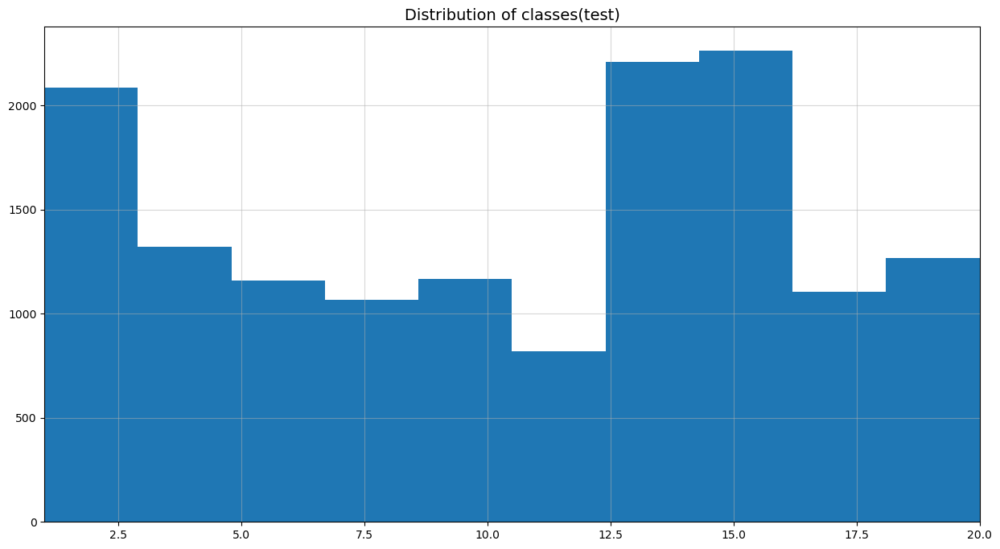

In [32]:
plt.figure(figsize=(15, 8))

plt.hist(classes_test)
plt.title("Distribution of classes(test)", fontsize=14)
plt.grid(alpha=0.5)
plt.xlim(1, 20)
plt.show()

### Same with train

In [33]:
labels_train_dir = labels_dir[np.array(list(map(lambda text: int(text[:-4]) in train_files, labels_dir)))]

In [34]:
len(labels_train_dir)

1331

In [35]:
labels_train = labels[np.array(list(map(lambda text: int(text[:-4]) in train_files, labels_dir)))]

In [36]:
len(labels_train)

1331

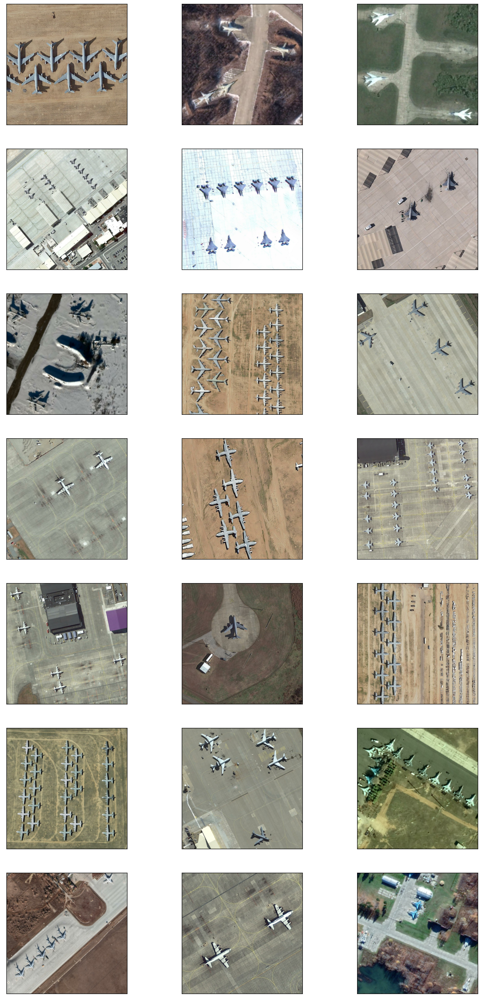

In [37]:
fig, axis = plt.subplots(nrows=7, ncols=3, figsize=(15, 30))

for i in range(7):
    for j in range(3):
        image = cv.cvtColor(cv.imread(os.path.join(images_path, f"{random.choice(labels_train_dir)[:-3]}jpg")), cv.COLOR_BGR2RGB)
        
        axis[i, j].set_xticks([])
        axis[i, j].set_yticks([])
        axis[i, j].imshow(image)

### Analys

In [38]:
image_info_train = image_info[np.array(list(map(lambda text: int(text[:-4]) in train_files, labels_dir)))]

In [39]:
image_info_train.max(axis=0), image_info_train.mean(axis=0), image_info_train[(image_info_train[:, :2] != 0).any(axis=1)].min(axis=0)

(array([1167,  950,   50]),
 array([802.75432006, 797.22464313,   5.91284748]),
 array([590, 549,   1]))

In [40]:
classes_train = np.array([rect[-1] for label in labels_train for rect in label])

In [41]:
len(classes_train)

7870

In [42]:
classes_train

array([ 1.,  1.,  1., ..., 14., 14., 14.])

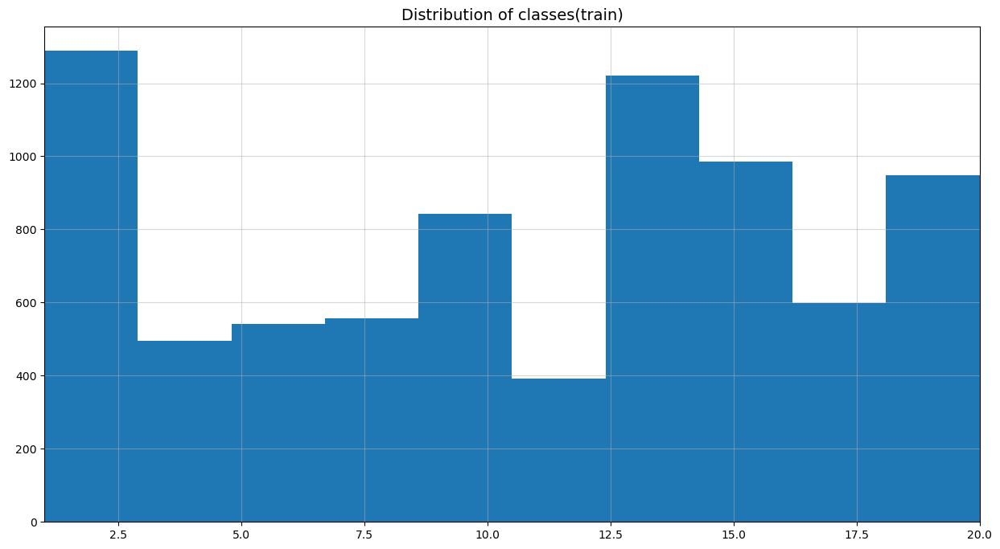

In [43]:
plt.figure(figsize=(15, 8))

plt.hist(classes_train)
plt.title("Distribution of classes(train)", fontsize=14)
plt.grid(alpha=0.5)
plt.xlim(1, 20)
plt.show()

### Show the distribution of number of objects on a single image

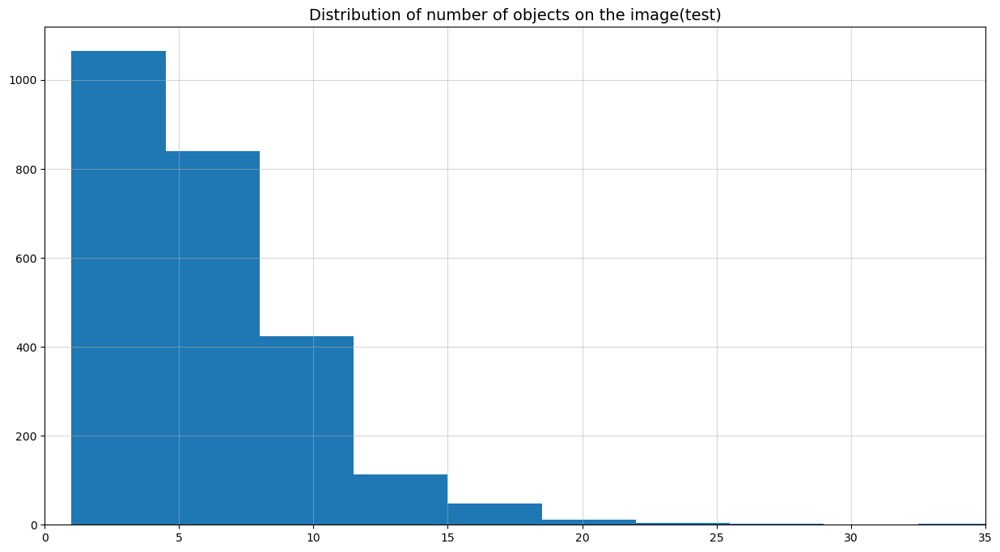

In [44]:
plt.figure(figsize=(15, 8))

plt.hist(image_info_test[:, 2])
plt.title("Distribution of number of objects on the image(test)", fontsize=14)
plt.grid(alpha=0.5)
plt.xlim(0, 35)
plt.show()

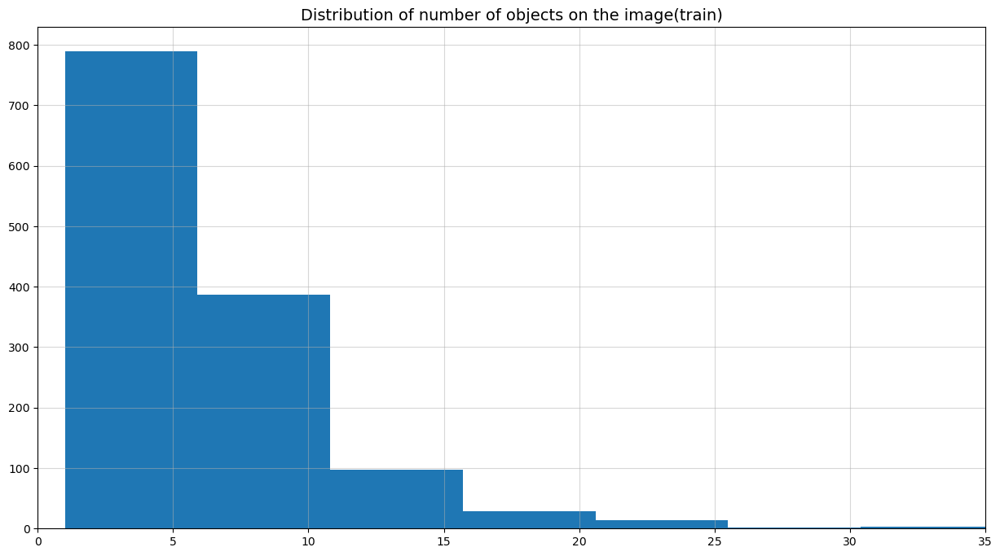

In [45]:
plt.figure(figsize=(15, 8))

plt.hist(image_info_train[:, 2])
plt.title("Distribution of number of objects on the image(train)", fontsize=14)
plt.grid(alpha=0.5)
plt.xlim(0, 35)
plt.show()

*As we can see, the distribution of the test and train sets look pretty much the same and they do not distinguish much. We checked it with examples of images on test and train sets, class distribution, and information about their images such as the mean width and height of the image and the number of classes on images. But the test set is twice larger than the train so I would like to add them up and make my own split.*

## Random image with bb

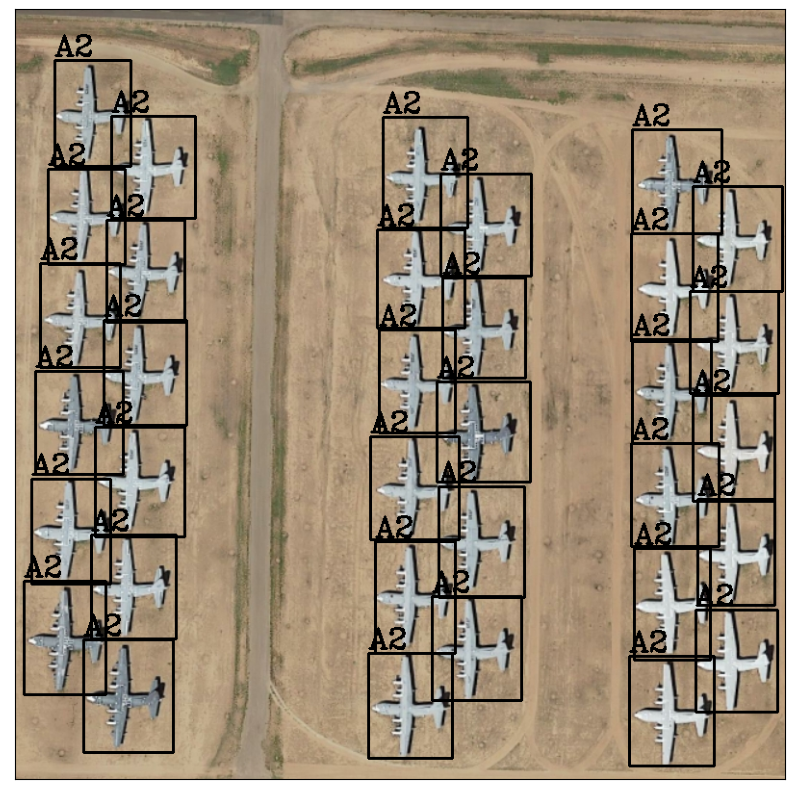

In [46]:
image_index = random.randint(0, len(labels_dir) - 1)
image = cv.cvtColor(cv.imread(os.path.join(images_path, labels_dir[image_index][:-3] + "jpg")), cv.COLOR_BGR2RGB)

*size, _ = image.shape
size = np.array(size)

for rect in labels[image_index]:
    image = cv.rectangle(image, (rect[:2] * size).astype(int), (rect[2:4] * size).astype(int), color=(0, 0, 0), thickness=2)
    
    image = cv.putText(image, f"A{int(rect[-1])}", (rect[:2] * size - np.array([0, 5])).astype(int), cv.FONT_HERSHEY_COMPLEX, 1, color=(0, 0, 0), thickness=2)

    
    
plt.figure(figsize=(10, 10))
plt.xticks([])
plt.yticks([])
plt.imshow(image)
plt.show()